In [1]:
import numpy as np
import nrrd
import matplotlib.pyplot as plt
%matplotlib notebook

In [10]:
filename = 'structure_721.nrrd'
#filename = 'speech.wav'

readdata, header = nrrd.read(filename)
header

OrderedDict([('type', 'unsigned char'),
             ('dimension', 3),
             ('space', 'left-posterior-superior'),
             ('sizes', array([528, 320, 456])),
             ('space directions',
              array([[25.,  0.,  0.],
                     [ 0., 25.,  0.],
                     [ 0.,  0., 25.]])),
             ('kinds', ['domain', 'domain', 'domain']),
             ('encoding', 'gzip'),
             ('space origin', array([0., 0., 0.]))])

In [3]:
# nrrd file must be define with space directions and as a matrix - contact us if you need other space orientation representations
space_dir = header['space directions']

In [4]:
readdata.shape

(528, 320, 456)

In [6]:
np.max(readdata[np.where(readdata!=1)])

0

In [5]:
# Check space directions is diagonal
np.count_nonzero(header['space directions'] - np.diag(np.diagonal(header['space directions'])))

0

In [ ]:
# Based on: https://www.na-mic.org/wiki/NAMIC_Wiki:DTI:Nrrd_format#NRRD_format_usage_for_NAMIC_DWI_volumes
# Each column is multiplied by a raster dimension

In [4]:
max_dens = 100000     # cells/mm^3   Clarify that all output dimensions are in microns
n_voxels = readdata.shape[0]*readdata.shape[1]*readdata.shape[2]
#vol_per_voxel = header['space directions'].diagonal().prod()/(1000)**3      # Assuming 'space directions is in um'
vol_per_voxel = space_dir.dot([1,1,1]).prod()/(1000)**3
vol_tot = n_voxels*vol_per_voxel
# Do we need the above?
readdata_scaled = readdata*max_dens/np.max(readdata)*vol_per_voxel
np.max(readdata_scaled)

1.5625

In [5]:
num = np.random.poisson(lam=readdata_scaled)

In [8]:
num.shape

(528, 320, 456)

In [9]:
np.mean(num[np.where(readdata==np.max(readdata))])

1.561195851128737

In [10]:
num[308:404,37:47,330]

array([[2, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 0, 2, 3, 0, 0, 0, 0, 0],
       [4, 3, 2, 2, 2, 0, 0, 0, 0, 0],
       [2, 2, 3, 0, 0, 0, 0, 0, 0, 0],
       [1, 2, 2, 0, 0, 0, 0, 0, 0, 0],
       [0, 2, 0, 1, 3, 0, 0, 0, 0, 0],
       [0, 1, 2, 3, 2, 0, 0, 0, 0, 0],
       [0, 2, 1, 1, 4, 0, 0, 0, 0, 0],
       [0, 2, 2, 2, 1, 0, 0, 0, 0, 0],
       [2, 0, 3, 4, 5, 0, 0, 0, 0, 0],
       [1, 1, 2, 3, 1, 0, 0, 0, 0, 0],
       [2, 2, 0, 4, 0, 0, 0, 0, 0, 0],
       [2, 0, 2, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [2, 1, 2, 1, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 2, 0, 1, 0, 0, 0, 0],
       [3, 3, 1, 1, 3, 2, 0, 0, 0, 0],
       [4, 2, 1, 1, 1, 2, 0, 0, 0, 0],
       [4, 3, 0, 2, 0, 1, 0, 0, 0, 0],
       [2, 0, 2, 0, 1, 4, 0, 0, 0, 0],
       [1, 1, 2, 2, 2, 1, 0, 0, 0, 0],
       [0, 1, 4, 3, 2, 2, 0, 0, 0, 0],
       [2, 2, 2, 3, 0, 1, 0, 0, 0, 0],
       [2, 1, 3, 3, 0, 2, 0, 0, 0, 0],
       [2, 1, 1, 1, 3, 1, 0, 0, 0, 0],
       [2, 1, 0, 3, 1, 1,

In [13]:

ncells_tot = np.sum(num)
rand_array = np.random.uniform(size=(3, ncells_tot))
x = np.empty(ncells_tot, dtype=float)
y = np.empty(ncells_tot, dtype=float)
z = np.empty(ncells_tot, dtype=float)
i = 0

#x_dim = header['space directions'][0,0]
#y_dim = header['space directions'][1,1]
#z_dim = header['space directions'][2,2]

In [12]:
# Old version
for index, val in np.ndenumerate(num):
    for k in range(val):
        x[i] = (float(index[0])+rand_array[0, i])*x_dim     # Stay in um or mm?
        y[i] = (float(index[1])+rand_array[1, i])*y_dim 
        z[i] = (float(index[2])+rand_array[2, i])*z_dim
        i+=1

KeyboardInterrupt: 

In [17]:
#%%timeit
# Much faster variant - only use non-zero cells
inds = np.nonzero(num)
i=0
x = np.empty(ncells_tot, dtype=float)
y = np.empty(ncells_tot, dtype=float)
z = np.empty(ncells_tot, dtype=float)

for j in range(len(inds[0])):
#    for k in range(num[inds[0][j],inds[1][j],inds[2][j]]):
    for k in range(num[inds[:,j]]):
        pt = space_dir.dot([float(inds[0][j])+rand_array[0, i],
                            float(inds[1][j])+rand_array[1, i],
                            float(inds[2][j])+rand_array[2, i]])
        
        x[i], y[i], z[i] = pt 
        i+=1

TypeError: tuple indices must be integers or slices, not tuple

In [16]:
x.shape

(102555,)

<IPython.core.display.Javascript object>


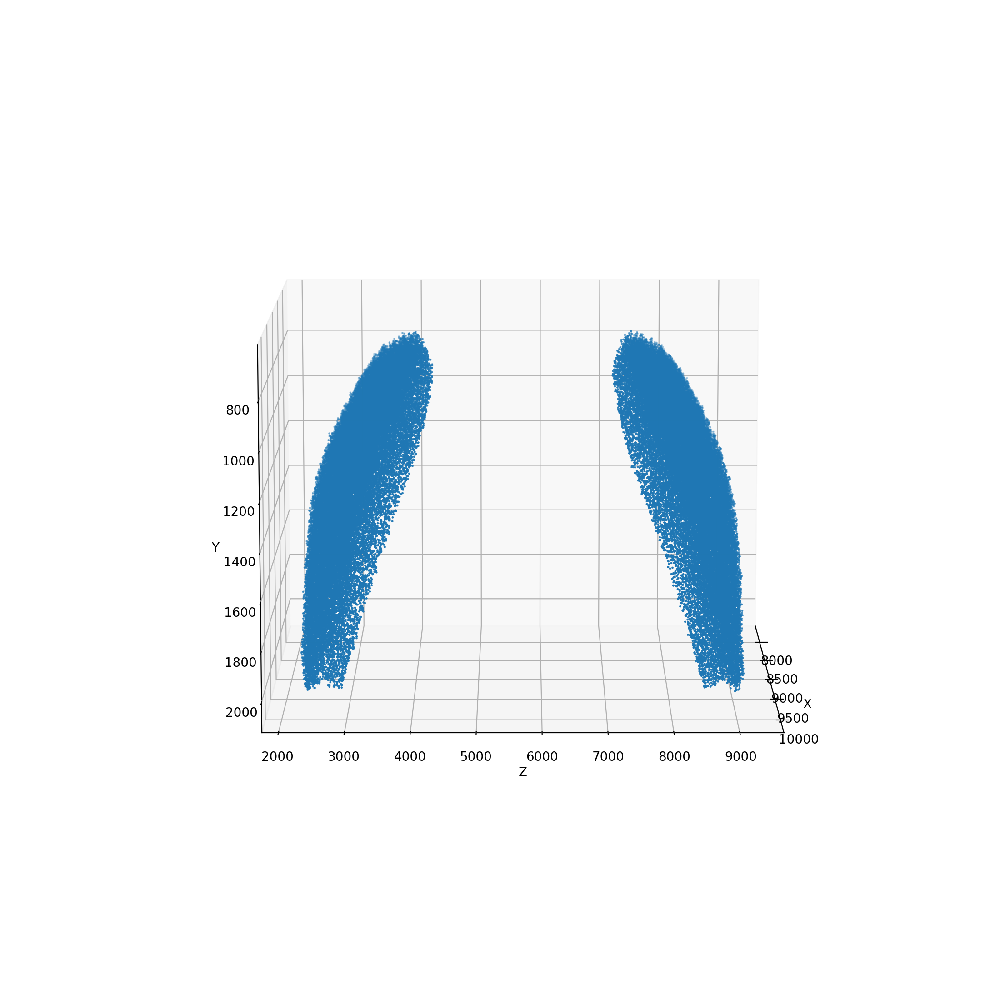

In [15]:
allen_orientation = True

fig = plt.figure(figsize=(11,11))     # Do plot a verification for each of these helper functions optionally
ax = fig.add_subplot(projection='3d')

if allen_orientation:     
    # View from the back of the head, see https://help.brain-map.org/display/mouseconnectivity/API#API-DownloadAtlas3-DReferenceModels
    ax.scatter(x,z,y, marker='.', s=2)     
    ax.invert_zaxis()
    ax.set_xlabel('X')
    ax.set_ylabel('Z')
    ax.set_zlabel('Y')
else:     
    ax.scatter(x,y,z, marker='.', s=2)     
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

ax.view_init(elev=10., azim=0)

In [19]:
orientation = 'RAS'

positions = np.column_stack((x, y, z))

x_pl = positions[:, orientation.find('A')]
y_pl = positions[:, orientation.find('R')]
if orientation.find('A') is not None:
    print('here')
    z_pl = positions[:, orientation.find('S')]
elif orientation.find('P') is not None:
    z_pl = -1*positions[:, orientation.find('S')]


In [22]:
orientation.find('A')

1

<IPython.core.display.Javascript object>


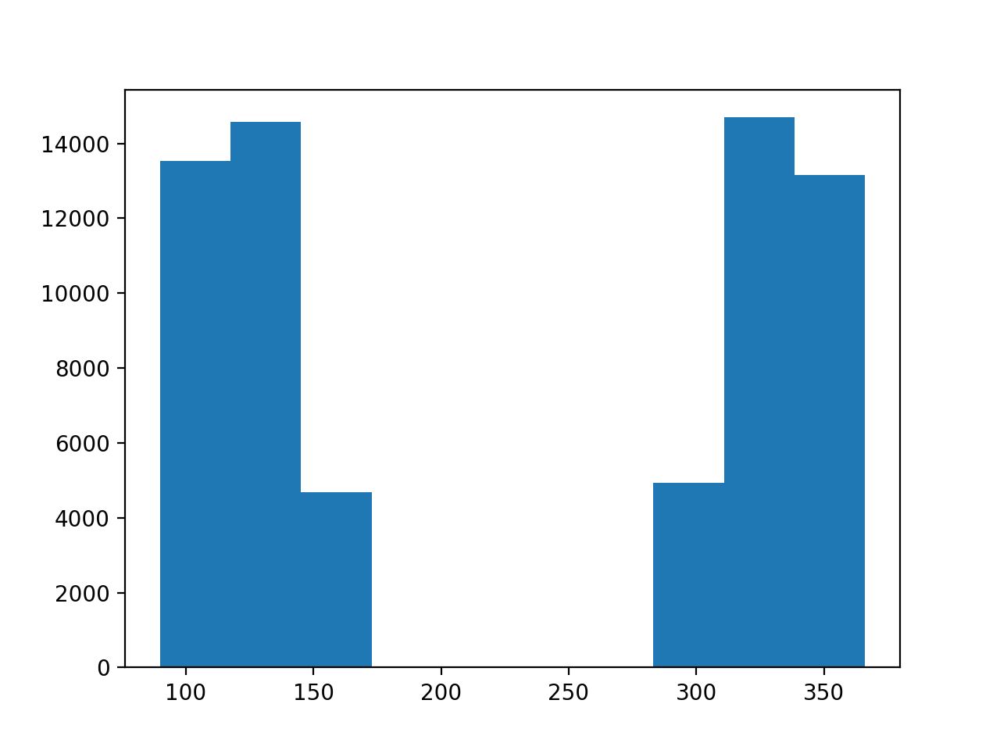

(array([13529., 14565.,  4686.,     0.,     0.,     0.,     0.,  4933.,
        14692., 13155.]),
 array([ 90. , 117.6, 145.2, 172.8, 200.4, 228. , 255.6, 283.2, 310.8,
        338.4, 366. ]),
 <BarContainer object of 10 artists>)

In [16]:
xms,yms,zms = np.where(readdata==np.max(readdata))
readdata[xms[0],yms[0],zms[0]]
fig0, ax0 = plt.subplots()
ax0.hist(zms)

<IPython.core.display.Javascript object>


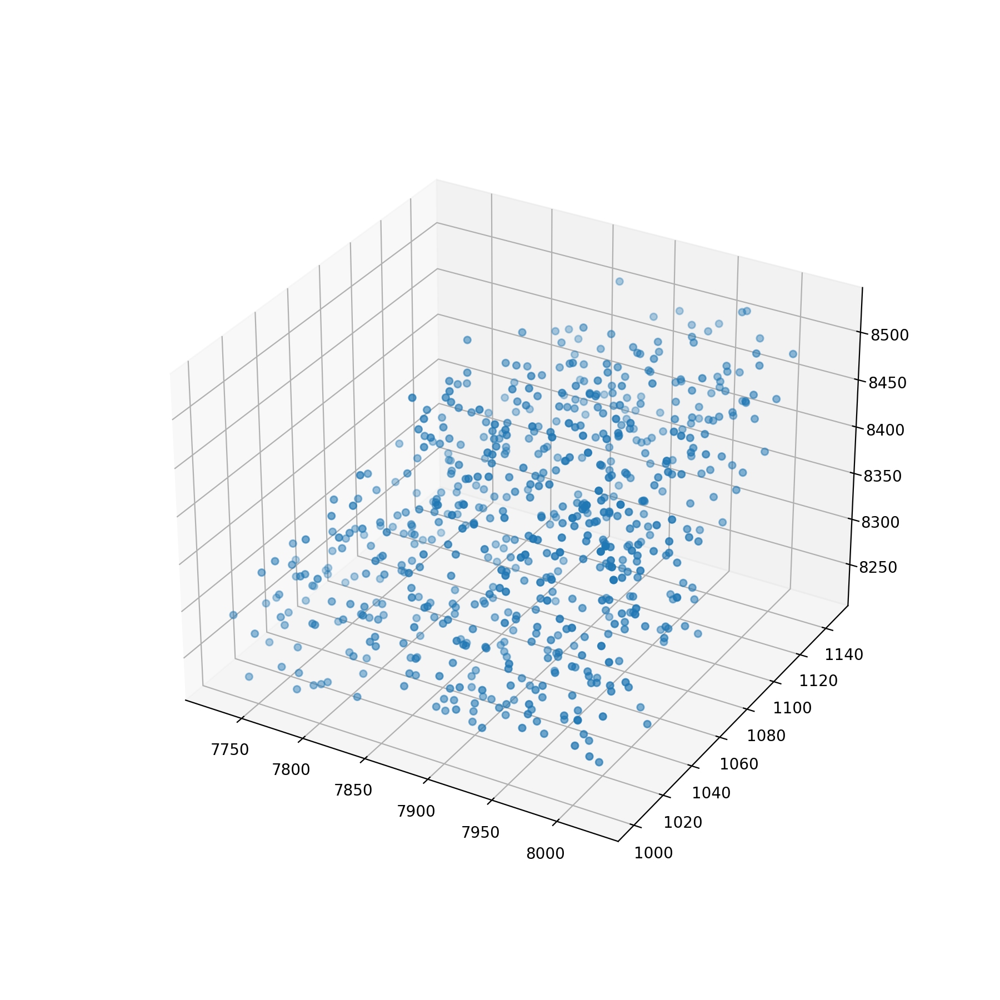

Number of cells: 677
Expected number of cells: 645.3125
Expected number of cells: 677


In [17]:
# Zoom in and do quantitative verification
# Non-zero regions
# x = 308 to 404
# y = 37 to 78
# z = 329 to 342

x_low = 308
x_high = 320
y_low = 40
y_high = 47
z_low = 329
z_high = 340
#n_vox = (x_high-x_low+1)*(z_high-z_low+1)*(z_high-z_low+1)

x_dim = header['space directions'][0,0]
y_dim = header['space directions'][1,1]
z_dim = header['space directions'][2,2]

x_low_um = x_low*x_dim
x_high_um = (x_high+1)*x_dim
y_low_um = y_low*y_dim
y_high_um = (y_high+1)*y_dim
z_low_um = z_low*z_dim
z_high_um = (z_high+1)*z_dim

ind_sub = np.where((x>x_low_um)&(x<x_high_um)&(y>y_low_um)&(y<y_high_um)&(z>z_low_um)&(z<z_high_um))
x_sub = x[ind_sub]
y_sub = y[ind_sub]
z_sub = z[ind_sub]

fig_sub = plt.figure(figsize=(9,9))
ax_sub = fig_sub.add_subplot(projection='3d')

ax_sub.scatter(x_sub, y_sub, z_sub, marker='o', s=20)

n_sub = len(x_sub)
print('Number of cells:', n_sub)
# +1 because want inclusive of endpoints
n_sub_exp = np.sum(readdata[x_low:x_high+1, y_low:y_high+1, z_low:z_high+1])*100000*vol_per_voxel
print('Expected number of cells:', n_sub_exp)

print('Expected number of cells:', np.sum(num[x_low:x_high+1, y_low:y_high+1, z_low:z_high+1]))


In [18]:
xx, yy, zz = np.meshgrid(range(readdata.shape[0]), range(readdata.shape[1]), range(readdata.shape[2]), indexing='ij') 
#positions = list(zip(list(xx), list(yy), list(zz)))


<IPython.core.display.Javascript object>


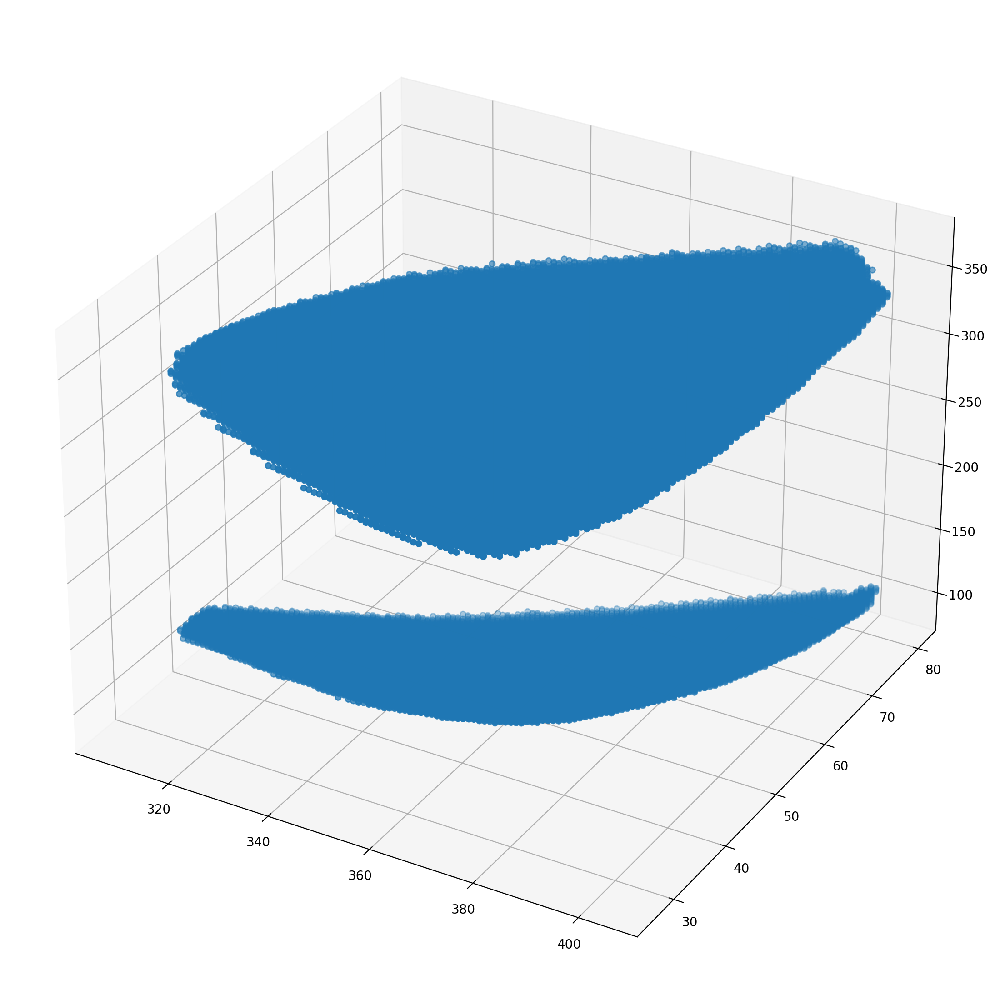

/tmp/ipykernel_20620/1900856406.py:5: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax2 = Axes3D(fig2)


In [19]:
from mpl_toolkits.mplot3d import Axes3D

inds = np.nonzero(readdata)
fig2 = plt.figure(figsize=(11,11))
ax2 = Axes3D(fig2)
ax2.scatter(xx[inds], yy[inds], zz[inds])
# Currently not scaled up, can scale up

In [20]:
# Check reflection

half_z_size = readdata.shape[2]/2

lower_half = readdata[:,:,:int(half_z_size)].astype('int8')
upper_half = readdata[:,:,int(half_z_size):].astype('int8')

upper_reflected = np.flip(upper_half, axis=-1) 

upper_reflected.shape

diff_refl = upper_reflected-lower_half
inds = np.where(diff_refl==np.max(diff_refl))


inds
diff_refl[308,38,127]
upper_reflected[308,38,127]
lower_half[308,38,127]
np.max(diff_refl)
lower_half.dtype

dtype('int8')

<IPython.core.display.Javascript object>


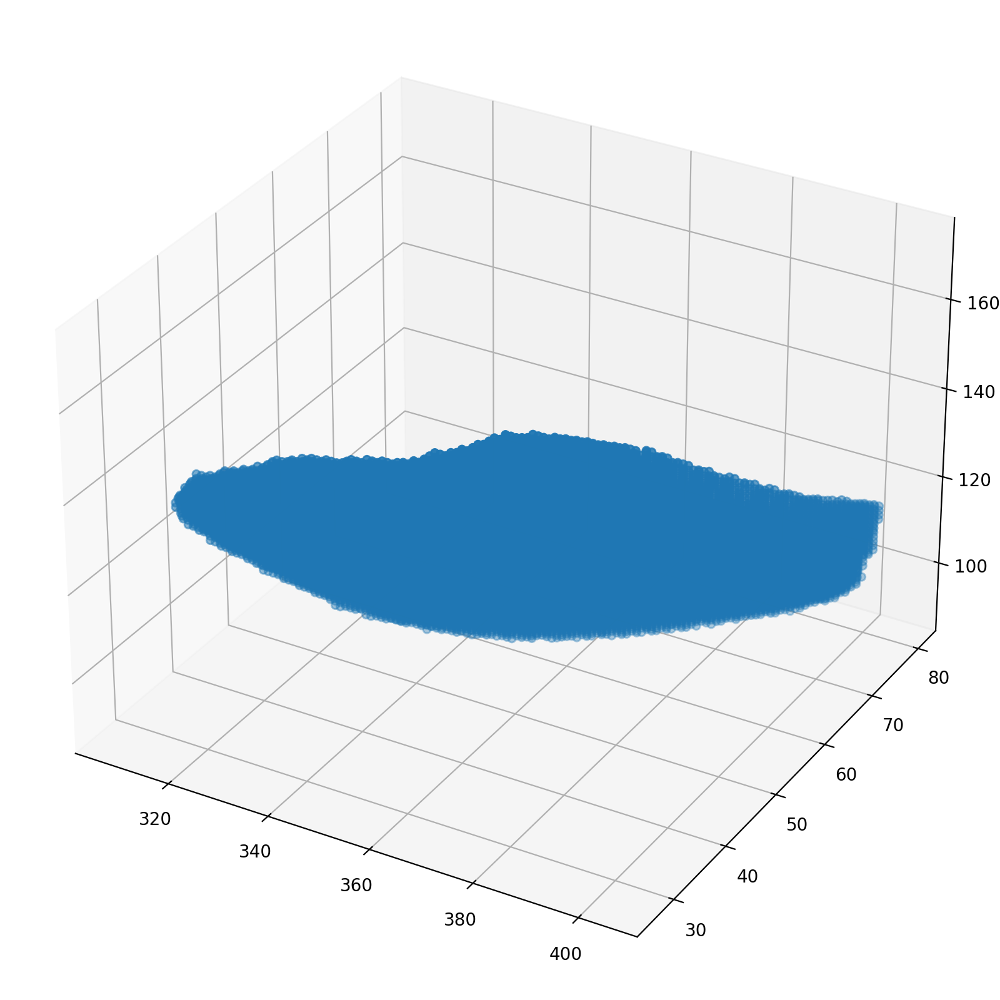

/tmp/ipykernel_20620/1768409271.py:8: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax3 = Axes3D(fig3)


In [28]:
xx, yy, zz = np.meshgrid(range(readdata.shape[0]), 
                         range(readdata.shape[1]), 
                         range(int(np.divide(readdata.shape[2],2))), 
                         indexing='ij') 

inds = np.nonzero(lower_half)
fig3 = plt.figure(figsize=(8,8))
ax3 = Axes3D(fig3)
ax3.scatter(xx[inds], yy[inds], zz[inds])

<IPython.core.display.Javascript object>


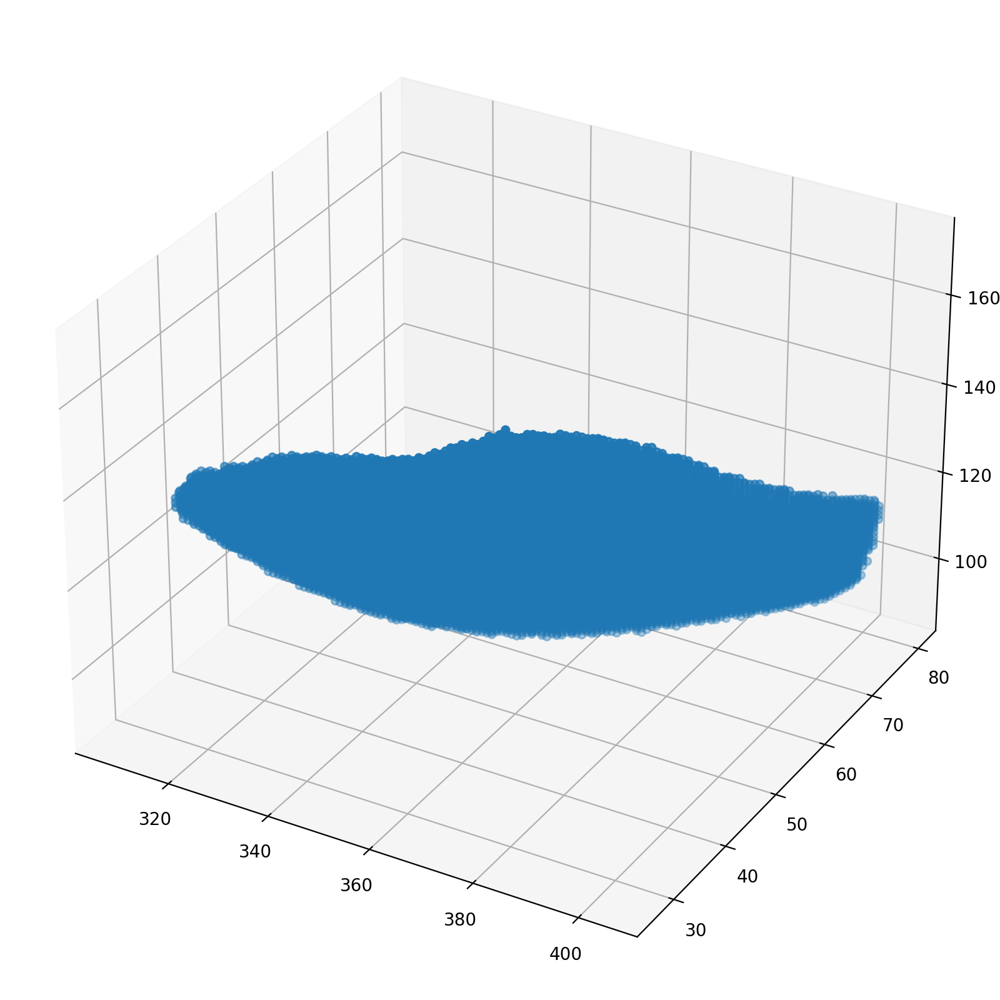

/tmp/ipykernel_20620/1995572520.py:8: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax4 = Axes3D(fig4)


In [29]:
xx, yy, zz = np.meshgrid(range(readdata.shape[0]), 
                         range(readdata.shape[1]), 
                         range(int(np.divide(readdata.shape[2],2))), 
                         indexing='ij') 

inds = np.nonzero(upper_reflected)
fig4 = plt.figure(figsize=(8,8))
ax4 = Axes3D(fig4)
ax4.scatter(xx[inds], yy[inds], zz[inds])

<IPython.core.display.Javascript object>


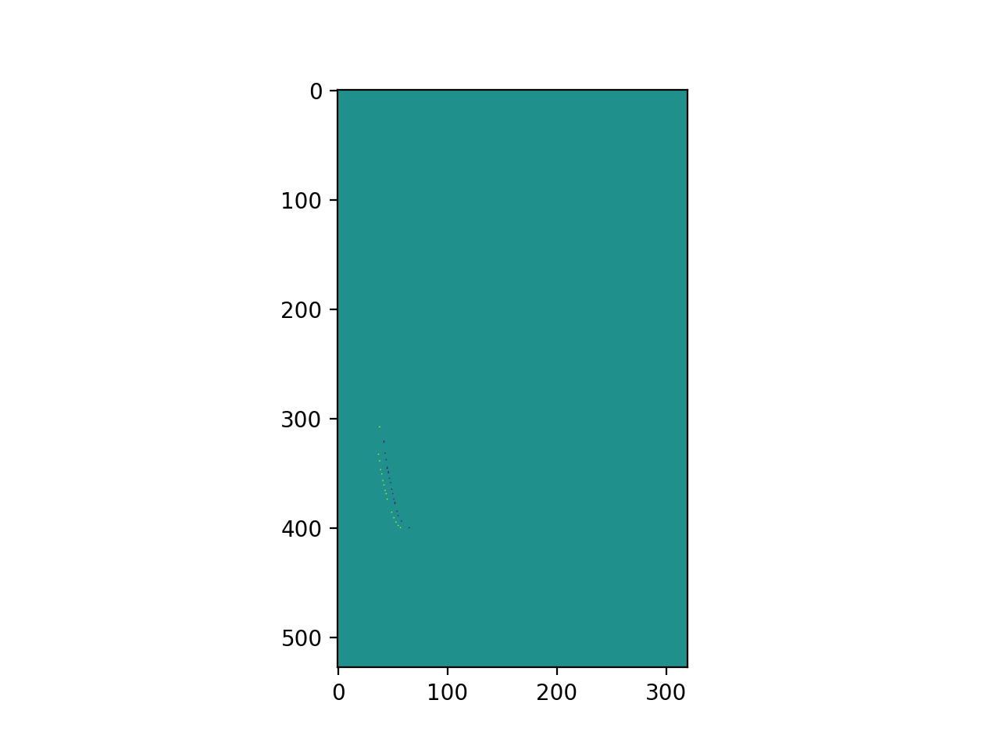

In [64]:
fig,ax = plt.subplots()
ax.imshow(diff_refl[:,:,125]*255)


In [62]:
diff_refl.shape
np.min(diff_refl)
#np.max(diff_refl)

-1

In [20]:
readdata[x_low:x_high, y_low:y_high, z_low:z_high]

array([[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],

       [[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],

       [[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],

       [[1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
        [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
     

In [43]:
upper_reflected[307:312, 37:40, 126]

array([[0, 0, 0],
       [1, 0, 0],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

In [42]:
lower_half[307:312, 37:40, 127]

array([[0, 0, 0],
       [0, 1, 0],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

In [ ]:
# Crashes kernel

from pylab import *
import matplotlib.cm as cmx
from mpl_toolkits.mplot3d import Axes3D
def scatter3d(x,y,z, cs, colorsMap='binary'):
    cm = plt.get_cmap(colorsMap)
    cs_vec = cm(readdata)
    cNorm = matplotlib.colors.Normalize(vmin=np.min(cs_vec), vmax=np.max(cs_vec))
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cm)
    fig = plt.figure(figsize=(14,14))
    ax = Axes3D(fig)
    ax.scatter(x, y, z, c=scalarMap.to_rgba(cs_vec))
    scalarMap.set_array(cs)
    fig.colorbar(scalarMap)
    plt.show()
    

inds = np.nonzero(readdata)
scatter3d(xx[inds], yy[inds], zz[inds], readdata[inds])

#fig2.colorbar(color_map)

/tmp/ipykernel_1284174/1574419028.py:10: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


In [19]:
from pylab import *
from mpl_toolkits.mplot3d import Axes3D

fig2 = plt.figure(figsize=(14,14))
ax2 = fig2.add_subplot(projection='3d')

colo = readdata
color_map = cm.ScalarMappable(cmap=cm.Greens_r)
color_map.set_array(colo)

yg = ax2.scatter(xx, yy, zz, c=cm.Greens_r(colo), marker='o')
cb = fig2.colorbar(color_map)

plt.show()

array([[[[0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         ...,
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ]],

        [[0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         ...,
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ]],

        [[0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [0.64705882, 0.        , 0.14901961, 1.        ],
         ...,
         [0.64705882, 0.        , 0.14901961, 1.        ],
         [

In [ ]:

#x1, yy, zz = np.meshgrid(np.arange(0, x_dim*readdata.shape[0], x_dim), 
#                np.arange(0, y_dim*readdata.shape[1], y_dim), 
#                np.arange(0, z_dim*readdata.shape[2], z_dim))
#g = np.meshgrid(np.arange(readdata.shape[0]), np.arange(readdata.shape[1]), np.arange(readdata.shape[2]), indexing='ij') 
#positions = np.vstack(map(np.ravel, g))
#g = np.meshgrid(np.arange(readdata.shape[0]), np.arange(readdata.shape[1]), np.arange(readdata.shape[2])) 
#positions = np.vstack(g).reshape(3,-1).T
#ax2.scatter(xx, yy, zz, alpha=)



final check convert each dimension then calculate total volume that way


need to properly handle space_directions as projection?

[[[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 ...

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  ...
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]]]
(array([309, 310, 311, ..., 403, 403, 404]), array([38, 42, 37, ..., 75, 76, 76]), array([131, 124, 125, ..., 119, 116, 118]))


<IPython.core.display.Javascript object>


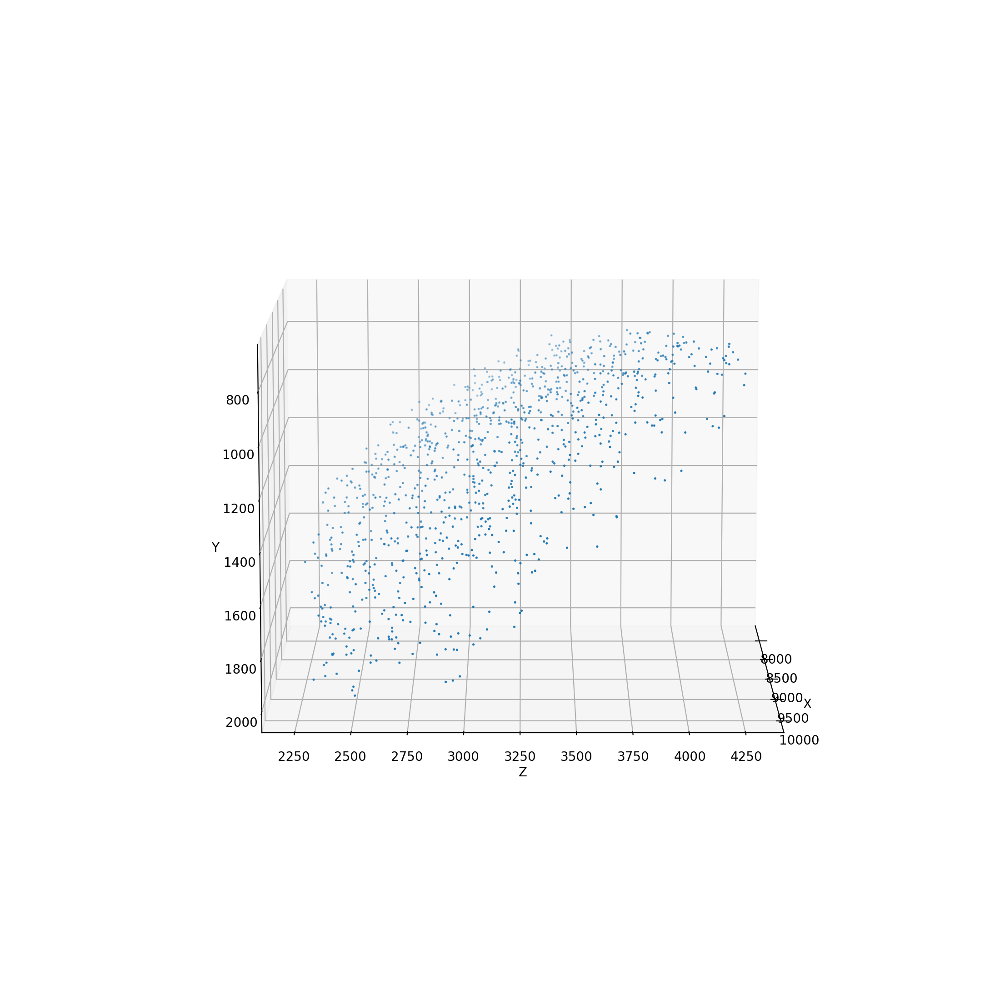

(1033, 3)

In [9]:
from bmtk.builder.auxi.node_params import positions_nrrd

#np.random.seed(1)
filename = 'structure_721.nrrd'

max_dens = 100000

positions = positions_nrrd(filename, max_dens, split_bilateral='z', plot=True)
positions.shape

[[[ 0  3 11]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  5  8]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  1  4]
  [ 0  1  0]
  [ 0  0  6]]]
(array([0, 0, 1, 1, 2, 2, 2, 2]), array([0, 0, 0, 0, 0, 0, 1, 2]), array([1, 2, 1, 2, 1, 2, 1, 2]))


<IPython.core.display.Javascript object>


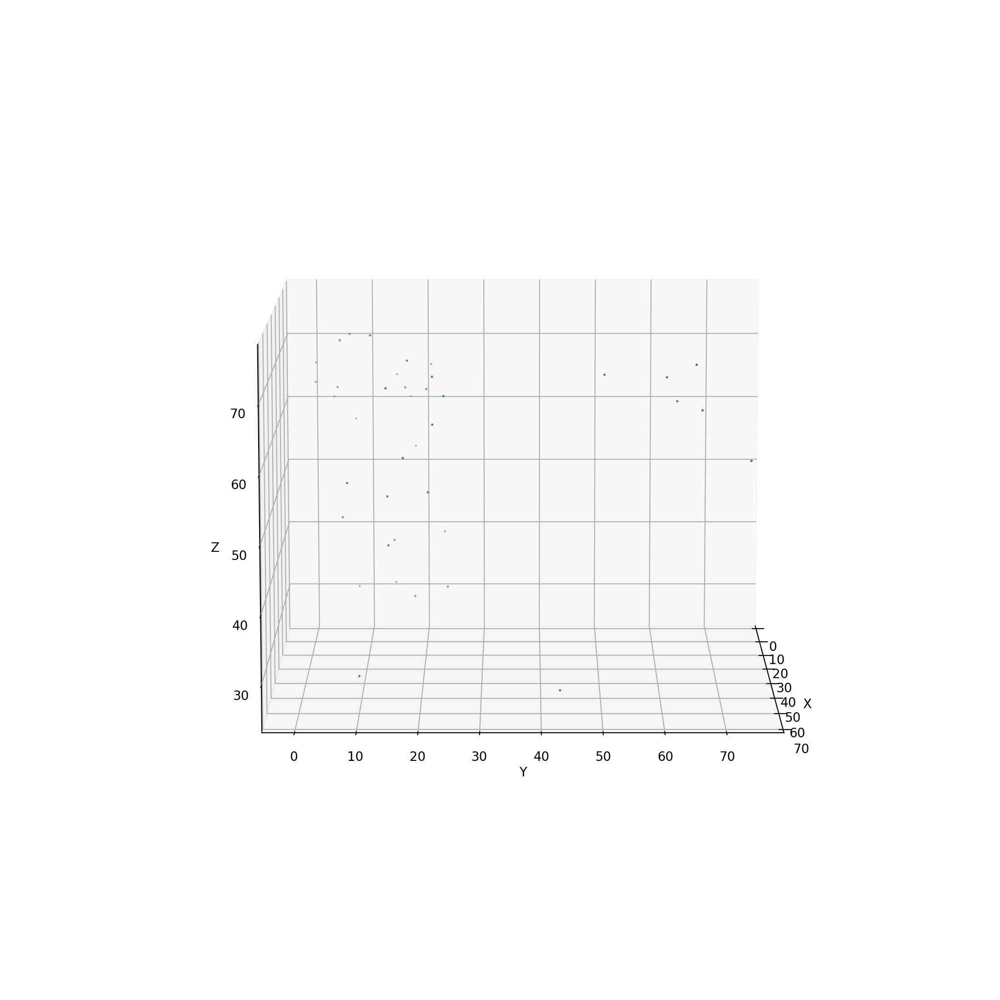

(39, 3)

In [11]:
from bmtk.builder.auxi.node_params import positions_density_matrix
np.random.seed(0)
mat = 100000*np.array([[[0,1,5],[0,0.5,0],[0,0,0]],
                [[0,1,5],[0,0.5,0],[0,0,0]],
                [[0,1,1],[0,1,0],[0,0,5]]])

position_scale=np.array([[25.0,0,0],[0,25.0,0],[0,0,25.0]])

points = positions_density_matrix(mat, position_scale, plot=True)

points.shape

#assert(points.shape[1] == 3)
#assert(np.max(abs(points[:,0]))<25*3)
#points

In [13]:
np.sum(mat*0.025**3)

32.81250000000001

In [8]:
def positions_density_matrix(mat, position_scale=np.array([[1,0,0],[0,1,0],[0,0,1]]), origin=np.array([0,0,0]), 
                             plot=False, CCF_orientation=False,dmin=0.0):
    """This function places random x,y,z coordinates according to a supplied 3D array of densities (cells/mm^3).
    The optional position_scale parameter defines a transformation matrix A to physical space such that:
    [x_phys, y_phys, z_phys] = A * [x_mat, y_mat, z_mat]

    Note: position_scale and output coordinates are in units of microns, while density is specified in mm^3.

    :param mat: A 3-dimensional matrix of densities (cells/mm^3)
    :param position_scale: A (3, 3) matrix (microns)
    :param plot: Generates a plot of the cell locations when set to True
    :param CCF_orientation: if True, plot will be oriented for Allen atlas common coordinate framework
           See https://help.brain-map.org/display/mouseconnectivity/API#API-DownloadAtlas3-DReferenceModels

    :return: A (N, 3) matrix (microns)
    """

    # Can later put this inside check function?
    if (dmin<0):
        raise ValueError('Minimum distance between cell centers (dmin) must not be negative')
    vol_per_voxel = position_scale.astype(float).dot([1, 1, 1]).prod() / (1000) ** 3
    mat = mat.astype(float) * vol_per_voxel

    # Draw Poisson distributed number of cells per voxel based on density
    num = np.random.poisson(lam=mat)

    ncells_tot = np.sum(num)

    # Assign random positions to the number of cells in each voxel
    rand_array = np.random.uniform(size=(3, ncells_tot))
    x = np.empty(ncells_tot, dtype=float)
    y = np.empty(ncells_tot, dtype=float)
    z = np.empty(ncells_tot, dtype=float)
    dmin_grid_x = np.empty(ncells_tot, dtype=float)
    dmin_grid_y = np.empty(ncells_tot, dtype=float)
    dmin_grid_z = np.empty(ncells_tot, dtype=float)

    # Temporarily make really large reserve while just testing that it works
    rand_reserve = np.random.uniform(size=(3, 5*ncells_tot))

    i = 0     # Position in rand_array
    r = 0     # Position in rand_reserve to draw additional as needed
    inds = np.nonzero(num)
    for j in range(len(inds[0])):
        for k in range(num[inds[0][j], inds[1][j], inds[2][j]]):
            d = 0
            rand_offset = rand_array[:, i]
            
            while d <= dmin:
                pt = position_scale.dot([float(inds[0][j]) + rand_offset[0],
                                float(inds[1][j]) + rand_offset[1],
                                float(inds[2][j]) + rand_offset[2]])
                dmin_grid_x_temp = np.floor(pt[0]/dmin)
                dmin_grid_y_temp = np.floor(pt[1]/dmin)
                dmin_grid_z_temp = np.floor(pt[2]/dmin)
                #print(pt)
                #print(f'{dmin_grid_x_temp}, {dmin_grid_y_temp}, {dmin_grid_z_temp}')
                
                near_inds = (dmin_grid_x>=dmin_grid_x_temp-1) & (dmin_grid_x<=dmin_grid_x_temp+1) \
                          & (dmin_grid_y>=dmin_grid_y_temp-1) & (dmin_grid_y<=dmin_grid_y_temp+1) \
                          & (dmin_grid_z>=dmin_grid_z_temp-1) & (dmin_grid_z<=dmin_grid_z_temp+1)
                #print(dmin_grid_x[near_inds])
                dists = np.sqrt((pt[0]-x[near_inds])**2+(pt[1]-y[near_inds])**2+(pt[2]-z[near_inds])**2)        
                #if np.any(dists>2*dmin*np.sqrt(2)):
                #      print('HERE')
                #      print(dists)
                d = np.min(np.append(dists,float('inf')))
                # Accept point, add as usual and add grid location too
                rand_offset = rand_reserve[:, r]
                r += 1
                      
            x[i], y[i], z[i] = pt
            dmin_grid_x[i] = dmin_grid_x_temp
            dmin_grid_y[i] = dmin_grid_y_temp
            dmin_grid_z[i] = dmin_grid_z_temp
            i += 1
    x += origin[0]
    y += origin[1]
    z += origin[2]

    if plot:
        fig, ax = plt.subplots(figsize=(11, 11),  subplot_kw={'projection':'3d'})
        if CCF_orientation:
            plot_positions(x, z, y, ax, labels=['X','Z','Y'])
            ax.invert_zaxis()
            ax.view_init(elev=10., azim=0)
        else:
            plot_positions(x, y, z, ax, labels=['X','Y','Z'])
            ax.view_init(elev=10., azim=0)

    return np.column_stack((x, y, z))



In [77]:
def positions_density_matrix2(mat, position_scale=np.array([[1,0,0],[0,1,0],[0,0,1]]), origin=np.array([0,0,0]),
                              plot=False, CCF_orientation=False, dmin=0.0):
    """This function places random x,y,z coordinates according to a supplied 3D array of densities (cells/mm^3).
    The optional position_scale parameter defines a transformation matrix A to physical space such that:
    [x_phys, y_phys, z_phys] = A * [x_mat, y_mat, z_mat]

    Note: position_scale and output coordinates are in units of microns, while density is specified in mm^3.

    :param mat: A 3-dimensional matrix of densities (cells/mm^3)
    :param position_scale: A (3, 3) matrix (microns)
    :param plot: Generates a plot of the cell locations when set to True
    :param CCF_orientation: if True, plot will be oriented for Allen atlas common coordinate framework
           See https://help.brain-map.org/display/mouseconnectivity/API#API-DownloadAtlas3-DReferenceModels

    :return: A (N, 3) matrix (microns)
    """
    
    # Can later put this inside check function?
    if (dmin<0):
        raise ValueError('Minimum distance between cell centers (dmin) must not be negative')
    vol_per_voxel = position_scale.astype(float).dot([1, 1, 1]).prod() / (1000) ** 3
    mat = mat.astype(float) * vol_per_voxel

    '''
    # Draw Poisson distributed number of cells per voxel based on density
    num = np.random.poisson(lam=mat)
    
    ncells_tot = np.sum(num)
    '''
    max_dens = np.max(mat)
    n_vox_nz = np.nonzero(mat)[0].shape[0]
    ndraws = int(max_dens*n_vox_nz)

    # First distribute uniformly in non zero voxels at max_dens
    #num_vox = np.array([mat.shape[0], mat.shape[1], mat.shape[2]]) 
    #rand_pos = num_vox[:,None] * position_scale.dot(np.random.uniform(size=(3,ndraws)))
    rand_pos = np.random.uniform(size=(3, ndraws))
    inds = np.nonzero(mat)   # WAS num
    rand_nz_vox = np.random.choice(range(inds[0].shape[0]), ndraws)
    
    x = np.empty(ndraws, dtype=float)
    y = np.empty(ndraws, dtype=float)
    z = np.empty(ndraws, dtype=float)
    dmin_grid_x = np.empty(ndraws, dtype=float)
    dmin_grid_y = np.empty(ndraws, dtype=float)
    dmin_grid_z = np.empty(ndraws, dtype=float)
    vox = np.empty_like(rand_nz_vox)

    # Temporarily make really large reserve while just testing that it works
    rand_reserve = np.random.uniform(size=(3, 1*ndraws))
    rand_nz_vox_reserve = np.random.choice(range(inds[0].shape[0]), 1*ndraws)

    r = 0     # Position in rand_reserve to draw additional as needed
    
    for j in range(len(rand_nz_vox)):
        d = 0
        rand_offset = rand_pos[:,j]
        rand_vox = rand_nz_vox[j]
        while d <= dmin:
            pt = position_scale.dot([float(inds[0][rand_vox]) + rand_offset[0],
                            float(inds[1][rand_vox]) + rand_offset[1],
                            float(inds[2][rand_vox]) + rand_offset[2]])
            dmin_grid_x_temp = np.floor(pt[0]/dmin)
            dmin_grid_y_temp = np.floor(pt[1]/dmin)
            dmin_grid_z_temp = np.floor(pt[2]/dmin)
            #print(pt)
            #print(f'{dmin_grid_x_temp}, {dmin_grid_y_temp}, {dmin_grid_z_temp}')

            near_inds = (dmin_grid_x>=dmin_grid_x_temp-1) & (dmin_grid_x<=dmin_grid_x_temp+1) \
                      & (dmin_grid_y>=dmin_grid_y_temp-1) & (dmin_grid_y<=dmin_grid_y_temp+1) \
                      & (dmin_grid_z>=dmin_grid_z_temp-1) & (dmin_grid_z<=dmin_grid_z_temp+1)
            #print(dmin_grid_x[near_inds])
            dists = np.sqrt((pt[0]-x[near_inds])**2+(pt[1]-y[near_inds])**2+(pt[2]-z[near_inds])**2)        
            #if np.any(dists>2*dmin*np.sqrt(2)):
            #      print('HERE')
            #      print(dists)
            d = np.min(np.append(dists,float('inf')))
            # Accept point, add as usual and add grid location too
            rand_vox_now = rand_vox
            try:
                rand_offset = rand_reserve[:, r]
                rand_vox = rand_nz_vox_reserve[r]            
                r += 1
            except:
                #print('HERE')
                rand_reserve = np.random.uniform(size=(3, 1*ndraws))
                rand_nz_vox_reserve = np.random.choice(range(inds[0].shape[0]), 1*ndraws)
                rand_offset = rand_reserve[:, 0]
                rand_vox = rand_nz_vox_reserve[0]
                r = 1

        x[j], y[j], z[j] = pt
        dmin_grid_x[j] = dmin_grid_x_temp
        dmin_grid_y[j] = dmin_grid_y_temp
        dmin_grid_z[j] = dmin_grid_z_temp
        vox[j] = rand_vox_now
    
    # If mat values are not uniform, prune points according to density
    temp = set(mat.flat)
    temp.discard(0)
    
    if len(temp)>1:
        rand_keep = np.random.uniform(size=ndraws)

        for j in range(ndraws):
            x_vox = inds[0][vox[j]]
            y_vox = inds[1][vox[j]]
            z_vox = inds[2][vox[j]]
            vox_dens = mat[x_vox, y_vox, z_vox]
            if rand_keep[j] >= vox_dens/max_dens: 
                x[j], y[j], z[j] = float('NaN'), float('NaN'), float('NaN')
        x = x[~np.isnan(x)]
        y = y[~np.isnan(y)]
        z = z[~np.isnan(z)]

    # Shift re: origin 
    x += origin[0]
    y += origin[1]
    z += origin[2]
    
    if plot:
        fig, ax = plt.subplots(figsize=(11, 11),  subplot_kw={'projection':'3d'})
        if CCF_orientation:
            plot_positions(x, z, y, ax, labels=['X','Z','Y'])
            ax.invert_zaxis()
            ax.view_init(elev=10., azim=0)
        else:
            plot_positions(x, y, z, ax, labels=['X','Y','Z'])
            ax.view_init(elev=10., azim=0)

    return np.column_stack((x, y, z))
            

In [41]:
def positions_density_matrix3(mat, position_scale=np.array([[1,0,0],[0,1,0],[0,0,1]]), origin=np.array([0,0,0]),
                              plot=False, CCF_orientation=False, dmin=0.0):
    """This function places random x,y,z coordinates according to a supplied 3D array of densities (cells/mm^3).
    The optional position_scale parameter defines a transformation matrix A to physical space such that:
    [x_phys, y_phys, z_phys] = A * [x_mat, y_mat, z_mat]

    Note: position_scale and output coordinates are in units of microns, while density is specified in mm^3.

    :param mat: A 3-dimensional matrix of densities (cells/mm^3)
    :param position_scale: A (3, 3) matrix (microns)
    :param plot: Generates a plot of the cell locations when set to True
    :param CCF_orientation: if True, plot will be oriented for Allen atlas common coordinate framework
           See https://help.brain-map.org/display/mouseconnectivity/API#API-DownloadAtlas3-DReferenceModels

    :return: A (N, 3) matrix (microns)
    """
    
    # Can later put this inside check function?
    if (dmin<0):
        raise ValueError('Minimum distance between cell centers (dmin) must not be negative')
    vol_per_voxel = position_scale.astype(float).dot([1, 1, 1]).prod() / (1000) ** 3
    mat = mat.astype(float) * vol_per_voxel

    '''
    # Draw Poisson distributed number of cells per voxel based on density
    num = np.random.poisson(lam=mat)
    
    ncells_tot = np.sum(num)
    '''
    max_dens = np.max(mat)
    n_vox_nz = np.nonzero(mat)[0].shape[0]
    ndraws = int(max_dens*n_vox_nz)

    # First distribute uniformly in non zero voxels at max_dens
    #num_vox = np.array([mat.shape[0], mat.shape[1], mat.shape[2]]) 
    #rand_pos = num_vox[:,None] * position_scale.dot(np.random.uniform(size=(3,ndraws)))
    rand_pos = np.random.uniform(size=(3, ndraws))
    inds = np.nonzero(mat)   # WAS num
    rand_nz_vox = np.random.choice(range(inds[0].shape[0]), ndraws)
    
    x = np.full(ndraws, float('NaN'))
    y = np.full(ndraws, float('NaN'))
    z = np.full(ndraws, float('NaN'))
    dmin_grid_x = np.empty(ndraws, dtype=float)
    dmin_grid_y = np.empty(ndraws, dtype=float)
    dmin_grid_z = np.empty(ndraws, dtype=float)
    vox = np.empty_like(rand_nz_vox)

    r = 0     # Position in random numbers
    j = 0     # Position of current point being considered
    jmax = 0  # Max assigned j at current point (for verbose reporting)
    maxiter = 1000
    
    while 1:
        d = 0
        itercount = 0
        while d <= dmin:
            try:
                # Grab position from random number arrays
                rand_offset = rand_pos[:,r]
                rand_vox = rand_nz_vox[r]
            except:
                print('Generating more random numbers')
                # Ran out of random numbers, generate new batch
                rand_pos = np.random.uniform(size=(3, ndraws))
                rand_nz_vox = np.random.choice(range(inds[0].shape[0]), ndraws)
                r = 0
                rand_offset = rand_pos[:, r]
                rand_vox = rand_nz_vox[r]
            r += 1    
            
            pt = position_scale.dot([float(inds[0][rand_vox]) + rand_offset[0],
                            float(inds[1][rand_vox]) + rand_offset[1],
                            float(inds[2][rand_vox]) + rand_offset[2]])
            dmin_grid_x_temp = np.floor(pt[0]/dmin)
            dmin_grid_y_temp = np.floor(pt[1]/dmin)
            dmin_grid_z_temp = np.floor(pt[2]/dmin)
            
            near_inds = (dmin_grid_x>=dmin_grid_x_temp-1) & (dmin_grid_x<=dmin_grid_x_temp+1) \
                      & (dmin_grid_y>=dmin_grid_y_temp-1) & (dmin_grid_y<=dmin_grid_y_temp+1) \
                      & (dmin_grid_z>=dmin_grid_z_temp-1) & (dmin_grid_z<=dmin_grid_z_temp+1)
            dists = np.sqrt((pt[0]-x[near_inds])**2+(pt[1]-y[near_inds])**2+(pt[2]-z[near_inds])**2)        
            #foo = np.argwhere(near_inds)
            #print('dists shape:', dists.shape)
            #print('too near inds:', foo[dists>=dmin])
            
            d = np.nanmin(np.append(dists,float('inf')))
            
            itercount += 1
            if itercount > maxiter:
                break
     
        # Add point, grid location, and containing voxel
        x[j], y[j], z[j] = pt
        dmin_grid_x[j] = dmin_grid_x_temp
        dmin_grid_y[j] = dmin_grid_y_temp
        dmin_grid_z[j] = dmin_grid_z_temp
        vox[j] = rand_vox
        if d <= dmin:
            # Could not find a qualifying point in less than maxiter iterations
            # Remove conflicting other points
            temp = np.argwhere(near_inds)
            too_near = temp[dists<=dmin]
            print('pt:', pt)
            print('conflicts:', np.column_stack((x[too_near], y[too_near], z[too_near])))
            print('too near:', too_near)
            x[too_near], y[too_near], z[too_near] = np.nan, np.nan, np.nan
            
        if j > jmax:
            jmax = j
            print('jmax:', jmax)
        
        # Find smallest index point that is unassigned
        temp2 = np.argwhere(np.isnan(x))
        if len(temp2) == 0:
            break
        else:
            j = temp2[0]
            print('j:', j)
    
    # If mat values are not uniform, prune points according to density
    temp = set(mat.flat)
    temp.discard(0)
    
    if len(temp)>1:
        rand_keep = np.random.uniform(size=ndraws)

        for j in range(ndraws):
            x_vox = inds[0][vox[j]]
            y_vox = inds[1][vox[j]]
            z_vox = inds[2][vox[j]]
            vox_dens = mat[x_vox, y_vox, z_vox]
            if rand_keep[j] >= vox_dens/max_dens: 
                x[j], y[j], z[j] = float('NaN'), float('NaN'), float('NaN')
        x = x[~np.isnan(x)]
        y = y[~np.isnan(y)]
        z = z[~np.isnan(z)]

    # Shift re: origin 
    x += origin[0]
    y += origin[1]
    z += origin[2]
    
    if plot:
        fig, ax = plt.subplots(figsize=(11, 11),  subplot_kw={'projection':'3d'})
        if CCF_orientation:
            plot_positions(x, z, y, ax, labels=['X','Z','Y'])
            ax.invert_zaxis()
            ax.view_init(elev=10., azim=0)
        else:
            plot_positions(x, y, z, ax, labels=['X','Y','Z'])
            ax.view_init(elev=10., azim=0)

    return np.column_stack((x, y, z))
            
def positions_nrrd (nrrd_filename, max_dens_per_mm3, split_bilateral=None, plot=False, dmin=0.0):
    '''Generates random cell positions based on a *.nrrd file. Matrix values are interpreted as cell densities
    for each voxel. The maximum density is scaled to max_dens_per_mm3 (cells/mm^3).
    If the *.nrrd file is a structural mask, cells will be placed uniformly at max_dens_per_mm3 within the
    structure geometry.
    By default, only one hemisphere is shown, but this can be disabled by setting bilateral=True.

    :param nrrd_filename: path to *.nrrd file
    :param max_dens_per_mm3: desired density at maximum value of nrrd array (cells/mm^3)
    :param split_bilateral: return only unilateral structure by removing half of the array along the given axis.
            If no splitting is desired, pass in None
    :return: A (N, 3) matrix (microns)
    '''

    readdata, header = nrrd.read(nrrd_filename)
    space_dir = header['space directions']
    origin = header['space origin']

    readdata_scaled = readdata / np.max(readdata) * max_dens_per_mm3

    if split_bilateral is not None:
        if split_bilateral=='x':
            readdata_scaled = readdata_scaled[:int(readdata_scaled.shape[0]/2), :, :]
        elif split_bilateral=='y':
            readdata_scaled = readdata_scaled[:, :int(readdata_scaled.shape[1]/2), :]
        elif split_bilateral=='z':
            readdata_scaled = readdata_scaled[:, :, :int(readdata_scaled.shape[2]/2)]
        else:
            error("split_bilateral must take values of 'x', 'y', or 'z', or 'None' if no processing is desired")
    
    # For testing non-uniform density
    #t = np.arange(0, readdata_scaled.shape[2], 1)
    #s = 1+np.sin(2*np.pi*0.1*t)
    #readdata_scaled = readdata_scaled * s
    
    positions = positions_density_matrix3(readdata_scaled, position_scale=space_dir, plot=plot, CCF_orientation=True, dmin=dmin)
    return positions


def plot_positions(x,y,z,ax,labels):
    # Do plot a verification for each of these helper functions

    ax.scatter(x,y,z, marker='.', s=3)

    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_zlabel(labels[2])

100/51218 cells placed
200/51218 cells placed
300/51218 cells placed
400/51218 cells placed
500/51218 cells placed
600/51218 cells placed
700/51218 cells placed
800/51218 cells placed
900/51218 cells placed
1000/51218 cells placed
1100/51218 cells placed
1200/51218 cells placed
1300/51218 cells placed
1400/51218 cells placed
1500/51218 cells placed
1600/51218 cells placed
1700/51218 cells placed
1800/51218 cells placed
1900/51218 cells placed
2000/51218 cells placed
2100/51218 cells placed
2200/51218 cells placed
2300/51218 cells placed
2400/51218 cells placed
2500/51218 cells placed
2600/51218 cells placed
2700/51218 cells placed
2800/51218 cells placed
2900/51218 cells placed
3000/51218 cells placed
3100/51218 cells placed
3200/51218 cells placed
3300/51218 cells placed
3400/51218 cells placed
3500/51218 cells placed
3600/51218 cells placed
3700/51218 cells placed
3800/51218 cells placed
3900/51218 cells placed
4000/51218 cells placed
4100/51218 cells placed
4200/51218 cells placed
4

33400/51218 cells placed
33500/51218 cells placed
33600/51218 cells placed
33700/51218 cells placed
33800/51218 cells placed
33900/51218 cells placed
34000/51218 cells placed
34100/51218 cells placed
34200/51218 cells placed
34300/51218 cells placed
34400/51218 cells placed
34500/51218 cells placed
34600/51218 cells placed
34700/51218 cells placed
34800/51218 cells placed
34900/51218 cells placed
35000/51218 cells placed
35100/51218 cells placed
35200/51218 cells placed
35300/51218 cells placed
35400/51218 cells placed
35500/51218 cells placed
35600/51218 cells placed
35700/51218 cells placed
35800/51218 cells placed
35900/51218 cells placed
36000/51218 cells placed
36100/51218 cells placed
36200/51218 cells placed
36300/51218 cells placed
36400/51218 cells placed
36500/51218 cells placed
36600/51218 cells placed
36700/51218 cells placed
36800/51218 cells placed
36900/51218 cells placed
37000/51218 cells placed
37100/51218 cells placed
37200/51218 cells placed
37300/51218 cells placed


<IPython.core.display.Javascript object>


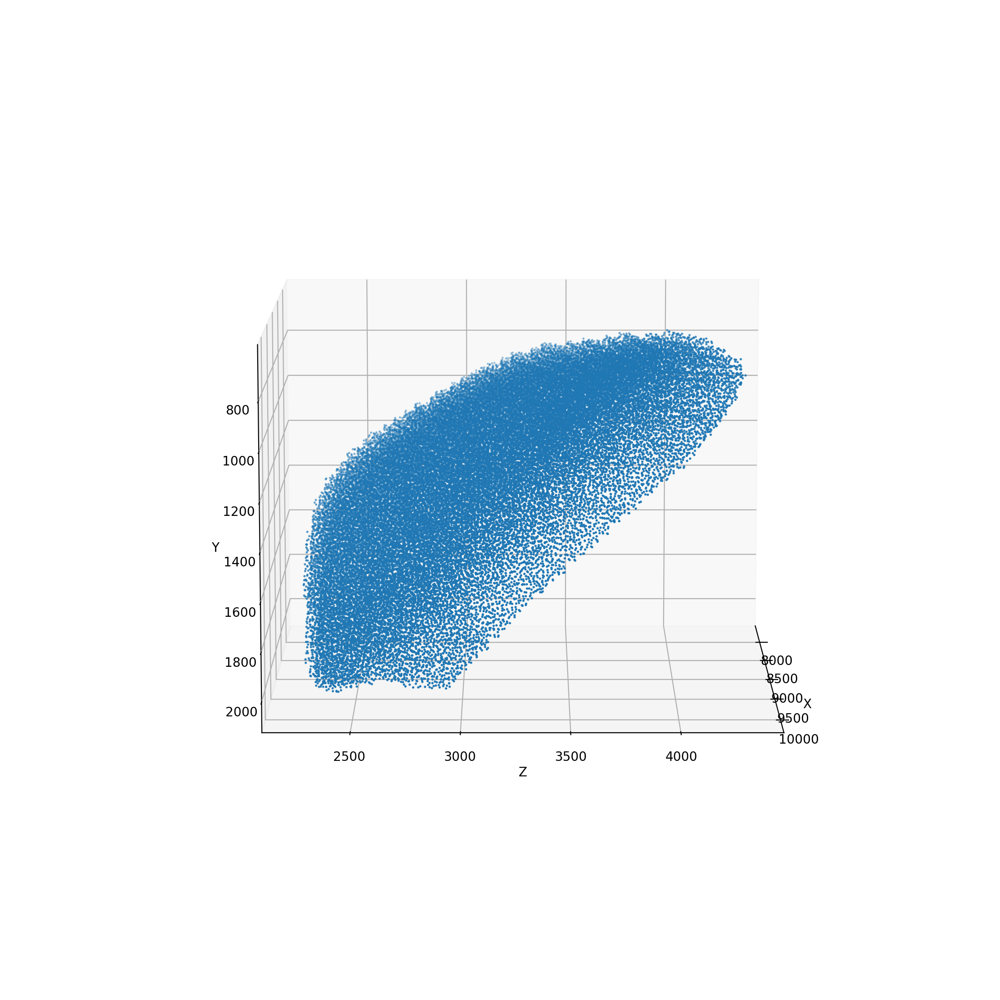

2h 29min 55s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [3]:
%%timeit -n 1 -r 1      # Careful timeit doesn't allow you to access results
from bmtk.builder.auxi.node_params import positions_nrrd

filename = 'structure_721.nrrd'

#max_dens = 2000
max_dens = 100000

positions = positions_nrrd(filename, max_dens, split_bilateral='z', plot=True, dmin=19.0, verbose=True)

# Check length
# Check minimum distance

In [20]:
p1 = np.array([9384.75060975, 1012.71640645, 3615.06692321])
p2 = np.array([9370.57101266, 1001.33568352, 3618.44108481])
p3 = np.array([8390.47351891, 1041.24137676, 3061.55717639])
p4 = np.array([8404.00452204, 1027.97257068, 3079.76663331])
np.linalg.norm(p1-p2)

18.49234421448747

In [27]:
positions.shape   # Generally right size still

(5121, 3)

In [5]:
pos_short = positions[0:5000,:] 
#pos_short = positions
dist = np.empty((pos_short.shape[0], pos_short.shape[0]))
#dist = np.full((pos_short.shape[0], pos_short.shape[0]), np.nan)

for i in range(pos_short.shape[0]):
    for j in range(pos_short.shape[0]):
        if i != j:
            dist[i,j] = np.linalg.norm(pos_short[i,:]-pos_short[j,:])
        else:
            dist[i,j] = np.nan
q=np.nanmin(dist)

q


10.061353590445282

In [13]:
dmin = 0.024  # in mm for comparison with cells / mm^3

V_sphere = 4/3*np.pi*(dmin/2)**3

# number of spheres at FCC/HCP packing: 0.74*V/V_sphere 
# density is above divided by V
dens_lim = 0.74/V_sphere

dens_lim


102234.94608333556

In [2]:
positions = positions_nrrd(filename, max_dens, split_bilateral='z', plot=True, dmin=10.0)

NameError: name 'positions_nrrd' is not defined

In [30]:
positions.shape

(971, 3)

In [30]:
np.array([1,
    2,
    3])

array([1, 2, 3])

In [114]:
%%timeit -n 1 -r 1
320*25

825 ns ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [94]:
a = (set([10]))
a.discard(0)
a

{10}

In [84]:
positions.shape

(51218, 3)

In [91]:
# Investigating Lloyd's relaxation but seems like this will be slow

from scipy.spatial import Delaunay
from collections import defaultdict
import itertools

#points=[[0.0, 0.0], [0.0, 1.0], [0.2, 0.5], [0.3, 0.6], [0.4, 0.5], [0.6, 0.3], [0.6, 0.5], [1.0, 0.0], [1.0, 1.0]]
points = positions
tri = Delaunay(points)
neiList=defaultdict(set)
for v in tri.simplices:
    for i,j in itertools.combinations(v,2):
        neiList[i].add(j)
        neiList[j].add(i)

51218

In [85]:
from scipy.spatial import Voronoi, voronoi_plot_2d
import matplotlib.pyplot as plt
vor = Voronoi(points)
#voronoi_plot_2d(vor)

In [125]:
#%%timeit -n 1 -r 1    # 5 min 21 sec
#distmin = np.empty(points.shape[0], dtype=float)
distmin = float('inf')

for pid in range(points.shape[0]):
    simps_with_p = tri.simplices[np.any(tri.simplices==pid, axis=1),:]
    temp = set(simps_with_p.flat)
    temp.discard(pid)

    for nei in temp:
        dist = np.sqrt(np.sum((positions[pid,:]-positions[nei])**2))
        distmin = min([dist,distmin])
        

In [126]:
distmin

18.0000072128069

In [116]:
simps_with_p = tri.simplices[np.any(tri.simplices==2048, axis=1),:]
temp = set(simps_with_p.flat)
temp.discard(2048)
dm = float('inf')

for nei in temp:
    dist = np.sqrt(np.sum((positions[2048,:]-positions[nei])**2))
    dm = np.min([dist,dm])
    print(dm)

31.884641432056412
31.884641432056412
31.884641432056412
31.884641432056412
24.028226326725306
22.383766322035875
22.383766322035875
21.847291599018703
21.847291599018703
18.377150216367564
18.377150216367564
18.377150216367564


In [34]:
foo = np.array([0,1,0])
x = np.array([0, float('NaN'), 1])
y = np.array([1, 2, 1])
z = np.array([1, 3, 2])
near_inds = foo <3
print(near_inds)
pt = np.array([4, 4, 5])

temp = np.argwhere(near_inds)
print('temp:', temp)

dists = np.sqrt((pt[0]-x[near_inds])**2+(pt[1]-y[near_inds])**2+(pt[2]-z[near_inds])**2)      
print('dists:', dists)

too_near = temp[dists <= 6]
too_near

[ True  True  True]
temp: [[0]
 [1]
 [2]]
dists: [6.40312424        nan 5.19615242]


array([[2]])

In [2]:
from bmtk.builder.auxi.node_params import positions_nrrd

In [14]:
%%timeit -n 1 -r 1      # Careful timeit doesn't allow you to access results

filename = 'structure_721.nrrd'

max_dens = 100000

positions = positions_nrrd(filename, max_dens, split_bilateral='z', plot=True, dmin=23.0, verbose=True)


100/51218 cells placed
200/51218 cells placed
300/51218 cells placed
400/51218 cells placed
500/51218 cells placed
600/51218 cells placed
700/51218 cells placed
800/51218 cells placed
900/51218 cells placed
1000/51218 cells placed
1100/51218 cells placed
1200/51218 cells placed
1300/51218 cells placed
1400/51218 cells placed
1500/51218 cells placed
1600/51218 cells placed
1700/51218 cells placed
1800/51218 cells placed
1900/51218 cells placed
2000/51218 cells placed
2100/51218 cells placed
2200/51218 cells placed
2300/51218 cells placed
2400/51218 cells placed
2500/51218 cells placed
2600/51218 cells placed
2700/51218 cells placed
2800/51218 cells placed
2900/51218 cells placed
3000/51218 cells placed
3100/51218 cells placed
3200/51218 cells placed
3300/51218 cells placed
3400/51218 cells placed
3500/51218 cells placed
3600/51218 cells placed
3700/51218 cells placed
3800/51218 cells placed
3900/51218 cells placed
4000/51218 cells placed
4100/51218 cells placed
4200/51218 cells placed
4

KeyboardInterrupt: 

In [228]:
import pandas as pd

def hcp(x_n, y_n, z_n, r):
    #i, j, k = [v.flatten()
               #for v in np.meshgrid(*([range(n)] * dim), indexing='ij')]
    #           for v in np.meshgrid(range(x_n), range(y_n), range(z_n))]
    #print(np.max(i))
    #df = pd.DataFrame({
    #    'x': 2*r * i + r*(j + k) % 2,
    #    'y': r * np.sqrt(3) * (j + 1/3 * (k % 2)),
    #    'z': 2 * r * np.sqrt(6) / 3 * k,
    #})
    # What happens if you increase by 1
    i = np.arange(x_n)
    j = np.arange(y_n)
    k = np.arange(z_n)
    
    get_x = lambda i,j,k,r: 2*r * i + r * ((j + k) % 2)
    x = get_x(i[:,None, None], j[None,:, None], k[None,None,:],r)
    get_y = lambda i,j,k,r: r * np.sqrt(3) * (j + 1/3 * (k % 2)) + 0*i
    y = get_y(i[:,None, None], j[None,:, None], k[None,None,:],r)
    get_z = lambda i,j,k,r: 2 * r * np.sqrt(6) / 3 * k +0*i + 0*j
    z = get_z(i[:,None, None], j[None,:, None], k[None,None,:],r)
    #y = r * np.sqrt(3) * (j + 1/3 * (k % 2))
    #z = 2 * r * np.sqrt(6) / 3 * k
    
    #x = x.reshape((x_n, y_n, z_n))
    #y = y.reshape((x_n, y_n, z_n))
    #z = z.reshape((x_n, y_n, z_n))
                  
    #print(np.max(df['x']))
    #return df
    return x, y, z

def _check_distance(pt, positions, dmin_grid, dmin):
    # ASSERT THAT POSITIONS AND DMIN_GRID HAVE SAME DIMENSIONS - but error would be for internal since user doesn't use this?
    # Returns True if point qualifies (does not violate minimum distance)
    dmin_grid_pt = np.floor(pt / dmin)

    near_inds = (dmin_grid[:,0] >= dmin_grid_pt[0] - 1) & (dmin_grid[:,0] <= dmin_grid_pt[0] + 1) \
              & (dmin_grid[:,1] >= dmin_grid_pt[1] - 1) & (dmin_grid[:,1] <= dmin_grid_pt[1] + 1) \
              & (dmin_grid[:,2] >= dmin_grid_pt[2] - 1) & (dmin_grid[:,2] <= dmin_grid_pt[2] + 1)
    dists = np.sqrt((pt[0] - positions[near_inds,0]) ** 2 + 
                    (pt[1] - positions[near_inds,1]) ** 2 + 
                    (pt[2] - positions[near_inds,2]) ** 2)

    d = np.nanmin(np.append(dists, float('inf')))
    return d>dmin, dmin_grid_pt



In [ ]:
r = 1
#x,y,z = hcp(120,50,88,r)
x,y,z = hcp(13, 13, 13, r)
z.shape

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12,9))
ax = Axes3D(fig)

ax.scatter(x,y,z, marker='.', s=2)

ax.scatter(x[1,1,1], y[1,1,1], z[1,1,1], c='r')
ax.scatter(x[1,2,1], y[1,2,1], z[1,2,1], c='k')
ax.scatter(x[2,1,1], y[2,1,1], z[2,1,1], c='k')
ax.scatter(x[1,1,2], y[1,1,2], z[1,1,2], c='k')
ax.scatter(x[1,2,2], y[1,2,2], z[1,2,2], c='k')
ax.scatter(x[0,1,2], y[0,1,2], z[0,1,2], c='k')

ax.set_xlim((0,27))
ax.set_ylim((0,27))
ax.set_zlim((0,27))
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()

In [226]:
#%%timeit -n 1 -r 1 
# SCALE YOUR BOX UP - but your initial numbers need to be in the same aspect ratios - or just calculate average spacing, CALCULATE JITTER, ELIMINATE EXCESS POINTS

# Let's target a box that is 1000 x 2000 x 567 um - but what if it's a cylinder?

# Other functions take an exact number of units

# Best bet is to estimate with the 0.74 ratio (not requiring physical sphere of cell be within box, just center of sphere)
# Find the radius of spacing
# Space and filter within bounding box
# Your ellipse is a filter down anyways?
# Jitter as allowed, trim extra units

# Shift origin last

def run_lattice(dmin):
    
    x_box = 1000 
    y_box = 2000
    z_box = 567

    N = 100000

    vol_box = x_box*y_box*z_box
    r = (vol_box*0.74/N*3/4/np.pi)**(1./3)

    x_n = np.ceil(x_box/(2*r)).astype('int')
    y_n = np.ceil(y_box/(r)/np.sqrt(3)).astype('int')
    z_n = np.ceil(z_box/(2*r)/np.sqrt(6)*3).astype('int')

    df = hcp(x_n, y_n, z_n, r)
    print(df.shape)

    #dmin = 5.0
    #dmin = 20.0    # 18 min!
    print(r)

    # Randomly remove excess units
    #todrop = random.sample(range(len(df)), len(df)-N)
    todrop = np.random.choice(range(len(df)), len(df)-N, replace=False)
    df = df.drop(index=todrop)
    print(df.shape)

    # Jitter by up to 2*r-dmin and check if okay,if not, redraw jitter - this allows you to jitter more aggressively than the most conservative
    # Doublecheck the rejected distances - if you removed units, you may be able to jitter by more, but this is already an aggressive jitter, so we'll let it be
    # Can experiment with jitter up to 4*r-dmin - convert to x, y, z through angle? the angle conversion would make it slow? Try it both ways
    # Start with most aggressive jitter and see how fast it runs
    x = df['x'].values
    y = df['y'].values
    z = df['z'].values
    positions = np.column_stack((x,y,z))

    print('x dim:', np.max(x)-np.min(x))
    print('y dim:', np.max(y)-np.min(y))
    print('z dim:', np.max(z)-np.min(z))

    jitr_max = 4*r-dmin
    #jitr_max = 2*r-dmin

    # Start with nothing, since we re-place each unit, we'll enter for each point after we jitter it 
    #dmin_grid = np.full((len(x),3), np.nan, dtype=float)
    dmin_grid = np.floor(positions / dmin)

    #r_reject = []
    #r_keep = []
    print(jitr_max)

    for i in range(len(x)):
        #pt = np.array([x[i],y[i],z[i]])
        # Don't need it to be uniformly distributed - the outer points are less likely to qualify
        keep = False
        while not keep:
            randr = np.random.uniform(0,jitr_max)
            randphi = np.random.uniform(0,2*np.pi)
            randtheta = np.random.uniform(0,np.pi)

            x_new = x[i] + randr*np.sin(randtheta)*np.cos(randphi)
            y_new = y[i] + randr*np.sin(randtheta)*np.sin(randphi)
            z_new = z[i] + randr*np.cos(randtheta)

            #jitx = np.random.uniform(-jitr_max,jitr_max)
            #jity = np.random.uniform(-jitr_max,jitr_max)
            #jitz = np.random.uniform(-jitr_max,jitr_max)

            #x_new = x[i] + jitx
            #y_new = y[i] + jity
            #z_new = z[i] + jitz

            pt_new = np.array([x_new, y_new, z_new])
            positions[i,:] = [np.nan, np.nan, np.nan]
            dmin_grid[i,:] = [np.nan, np.nan, np.nan]

            #keep, dmin_grid_pt = _check_distance(pt_new, positions, dmin_grid, dmin)
            dmin_grid_pt = np.floor(pt_new / dmin)

            near_inds = (dmin_grid[:,0] >= dmin_grid_pt[0] - 1) & (dmin_grid[:,0] <= dmin_grid_pt[0] + 1) \
                      & (dmin_grid[:,1] >= dmin_grid_pt[1] - 1) & (dmin_grid[:,1] <= dmin_grid_pt[1] + 1) \
                      & (dmin_grid[:,2] >= dmin_grid_pt[2] - 1) & (dmin_grid[:,2] <= dmin_grid_pt[2] + 1)
            dists = np.sqrt((pt_new[0] - positions[near_inds,0]) ** 2 + 
                        (pt_new[1] - positions[near_inds,1]) ** 2 + 
                        (pt_new[2] - positions[near_inds,2]) ** 2)

            d = np.min(np.append(dists, float('inf')))
            keep = d>dmin

            #if not keep:
            #    r_reject.append(randr)

        # Replace existing
        positions[i,:] = pt_new
        dmin_grid[i,:] = dmin_grid_pt
        #r_keep.append(randr)
        #print(i)

    fig, ax = plt.subplots(2,1)
    ax[0].hist(np.array(r_reject), bins = 40)
    ax[1].hist(np.array(r_keep), bins = 40)
    
    # x, y, z have not been updated at this point
    # Draw array all at once? It is pretty slow
    # Try using x,y,z jitter instead of transforming? Still takes just as long
    # Changing jitr_max didn't not have significant effect - what is slowest part?
    # Making inline function did not help

    # Get away from using dataframes

    # Check how it looks

    # Check rejected r values

In [324]:
def run_lattice2(dmin):
    
    x_box = 1000 
    y_box = 2000
    z_box = 567

    N = 100000

    vol_box = x_box*y_box*z_box
    r = (vol_box*0.74/N*3/4/np.pi)**(1./3)

    x_n = np.ceil(x_box/(2*r)).astype('int')
    y_n = np.ceil(y_box/(r)/np.sqrt(3)).astype('int')
    z_n = np.ceil(z_box/(2*r)/np.sqrt(6)*3).astype('int')

    x,y,z = hcp(x_n, y_n, z_n, r)
    print(x.shape)

    #dmin = 5.0
    #dmin = 20.0    # 18 min!
    print(2*r)

    # Randomly remove excess units
    #todrop = random.sample(range(len(df)), len(df)-N)
    # Set to NaN rather than drop to keep lattice in register
    
    x_vec = x.flatten()
    y_vec = y.flatten()
    z_vec = z.flatten()
    todrop = np.random.choice(range(len(x_vec)), len(x_vec)-N, replace=False)
    x_vec[todrop] = np.nan
    y_vec[todrop] = np.nan
    z_vec[todrop] = np.nan
    x = x_vec.reshape((x_n, y_n, z_n))
    y = y_vec.reshape((x_n, y_n, z_n))
    z = z_vec.reshape((x_n, y_n, z_n))    
    
    # Jitter by up to 2*r-dmin and check if okay,if not, redraw jitter - this allows you to jitter more aggressively than the most conservative
    # Doublecheck the rejected distances - if you removed units, you may be able to jitter by more, but this is already an aggressive jitter, so we'll let it be
    # Can experiment with jitter up to 4*r-dmin - convert to x, y, z through angle? the angle conversion would make it slow? Try it both ways
    # Start with most aggressive jitter and see how fast it runs

    jitr_max = 2*r-dmin

    # Start with nothing, since we re-place each unit, we'll enter for each point after we jitter it 
    #dmin_grid = np.full((len(x),3), np.nan, dtype=float)

    #r_reject = []
    #r_keep = []
    print(jitr_max)

    for i in range(x.shape[0]):
        for j in range(x.shape[1]):
            for k in range(x.shape[2]):
                # Don't need it to be uniformly distributed - the outer points are less likely to qualify
                if np.isnan(x[i,j,k]):
                    # Eliminated unit, skip
                    continue
                pt_old = [x[i,j,k], y[i,j,k], z[i,j,k]]
                x[i,j,k] = float('inf')
                y[i,j,k] = float('inf')
                z[i,j,k] = float('inf')
                
                keep = False
                
                q=2   # Depends on jitr_max
                indsi = np.arange(max(i-q,0),min(i+q,x.shape[0]))
                #np.delete(indsi,i)
                indsj = np.arange(max(j-q,0),min(j+q,x.shape[1]))
                #np.delete(indsj,j)
                indsk = np.arange(max(k-q,0),min(k+q,x.shape[2]))
                #print('k:',k)
                #print('j:', j)
                #print('indsk:', indsk)
                #print(x.shape[2]-1)
                #np.delete(indsk,k)
                #print('len indsi', len(indsi))
                #print('len indsj', len(indsj))
                #print('len indsk', len(indsk))
                
                near_inds = np.meshgrid(indsi, indsj, indsk)
                
                #print(x[near_inds])

                while not keep:
                    jitx = np.random.uniform(-jitr_max,jitr_max)
                    jity = np.random.uniform(-jitr_max,jitr_max)
                    jitz = np.random.uniform(-jitr_max,jitr_max)

                    x_new = pt_old[0] + jitx
                    y_new = pt_old[1] + jity
                    z_new = pt_old[2] + jitz    

                    if (x_new > x_box) or (x_new < 0):
                        continue
                    if (y_new > y_box) or (y_new < 0):
                        continue
                    if (z_new > z_box) or (z_new < 0):
                        continue
                    
                    '''
                    randr = np.random.uniform(0,jitr_max)
                    randphi = np.random.uniform(0,2*np.pi)
                    randtheta = np.random.uniform(0,np.pi)
                    
                    x_new = pt_old[0] + randr*np.sin(randtheta)*np.cos(randphi)
                    y_new = pt_old[1] + randr*np.sin(randtheta)*np.sin(randphi)
                    z_new = pt_old[2] + randr*np.cos(randtheta)

                    if (x_new > x_box) or (x_new < 0):
                        # reflect
                        x_new = pt_old[0] - randr*np.sin(randtheta)*np.cos(randphi)
                    if (y_new > y_box) or (y_new < 0):
                        y_new = pt_old[0] - randr*np.sin(randtheta)*np.sin(randphi)
                    if (z_new > z_box) or (z_new < 0):
                        z_new = pt_old[2] - randr*np.cos(randtheta)
                    '''
                    dists = np.sqrt((x_new - x[near_inds[0],near_inds[1],near_inds[2]]) ** 2 + 
                                (y_new - y[near_inds[0],near_inds[1],near_inds[2]]) ** 2 + 
                                (z_new - z[near_inds[0],near_inds[1],near_inds[2]]) ** 2)
                    #print('dists:', dists)
                    d = np.nanmin(np.append(dists.flatten(), float('inf')))
                    #print(d)
                    keep = d>dmin
                    #print(keep)

                    #if not keep:
                    #    r_reject.append(randr)

                # Replace existing
                x[i,j,k] = x_new
                y[i,j,k] = y_new
                z[i,j,k] = z_new
                #r_keep.append(randr)
                #print(i,j,k)
    
    x,y,z = x.flatten(), y.flatten(), z.flatten()
    
    print(x.shape)
    
    x = x[~np.isnan(x)]
    y = y[~np.isnan(y)]
    z = z[~np.isnan(z)]
    
    #print(len(x))

    #fig, ax = plt.subplots(2,1)
    #ax[0].hist(np.array(r_reject), bins = 40)
    #ax[1].hist(np.array(r_keep), bins = 40)
    
    return (x,y,z)
    # x, y, z have not been updated at this point
    # Draw array all at once? It is pretty slow
    # Try using x,y,z jitter instead of transforming? Still takes just as long
    # Changing jitr_max didn't not have significant effect - what is slowest part?
    # Making inline function did not help

    # Get away from using dataframes

    # Check how it looks

    # Check rejected r values

In [330]:
%%timeit -n 1 -r 1 
# Doesn't help speed up
#import os
#os.environ['NUMPY_EXPERIMENTAL_ARRAY_FUNCTION'] = '0'
#%prun run_lattice(5.0)
x,y,z = run_lattice2(20.0)

(40, 92, 28)
25.212469392341806
5.212469392341806
(103040,)
16.2 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [326]:
positions = np.column_stack((x,y,z))
pos_short = positions[0:5000,:] 
#pos_short = positions
dist = np.empty((pos_short.shape[0], pos_short.shape[0]))
#dist = np.full((pos_short.shape[0], pos_short.shape[0]), np.nan)

for i in range(pos_short.shape[0]):
    for j in range(pos_short.shape[0]):
        if i != j:
            dist[i,j] = np.linalg.norm(pos_short[i,:]-pos_short[j,:])
        else:
            dist[i,j] = np.nan
np.nanmin(dist)

20.00050698087698

In [327]:
print(np.min(x))
print(np.max(x))
print(np.min(y))
print(np.max(y))
print(np.min(z))
print(np.max(z))
print(x.shape)

0.000234621821922687
999.9913888217507
0.0008650763960993402
1999.441796029712
0.0027227169542696217
561.0289824245474
(100000,)


In [173]:
x = df['x']
y = df['y']
z = df['z']
#x = positions[:,0]
#y = positions[:,1]
#z = positions[:,2]

x_box = np.max(x) - np.min(x) + 2*r
y_box = np.max(y) - np.min(y) + 2*r
z_box = np.max(z) - np.min(z) + 2*r

vol_box = x_box*y_box*z_box

V_sphere = 4/3*np.pi*(r)**3

# number of spheres at FCC/HCP packing: 0.74*V/V_sphere 
# density is above divided by V
# dens_lim = 0.74/V_sphere

V_sphere*len(df)/vol_box

np.max(x) - np.min(x)

TypeError: tuple indices must be integers or slices, not str

<IPython.core.display.Javascript object>


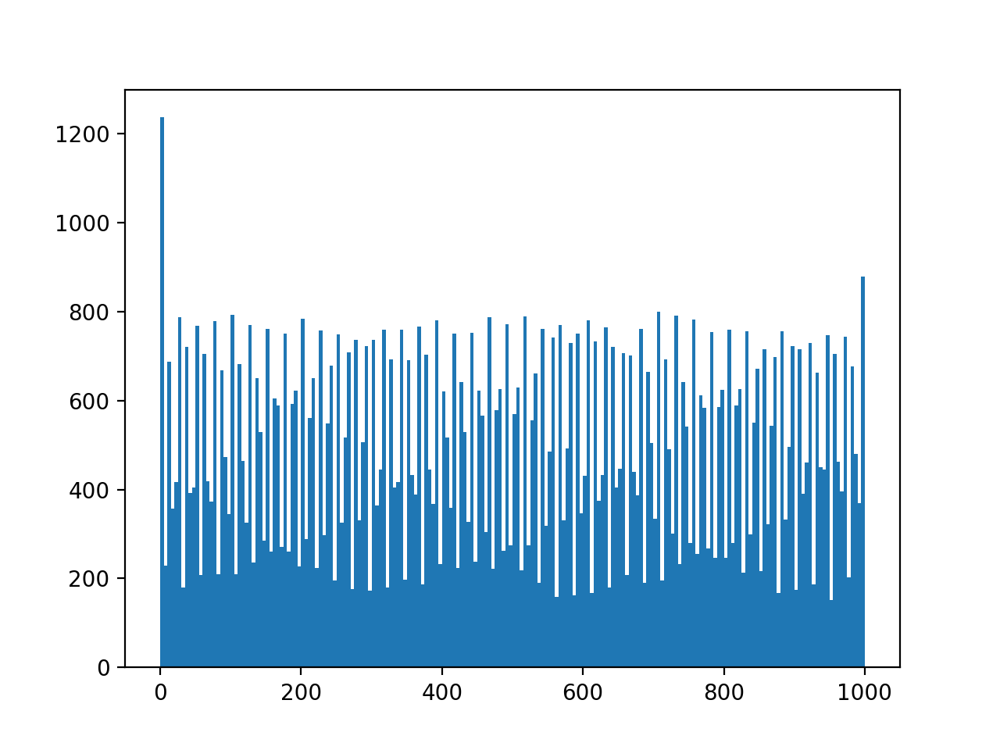

(array([1236.,  229.,  687.,  357.,  416.,  787.,  179.,  720.,  393.,
         404.,  768.,  207.,  704.,  418.,  373.,  779.,  210.,  668.,
         473.,  344.,  792.,  210.,  682.,  464.,  326.,  769.,  236.,
         651.,  529.,  286.,  761.,  260.,  604.,  589.,  271.,  750.,
         261.,  592.,  622.,  228.,  784.,  288.,  561.,  650.,  223.,
         757.,  298.,  548.,  678.,  196.,  749.,  326.,  517.,  708.,
         177.,  736.,  331.,  506.,  723.,  172.,  737.,  364.,  445.,
         759.,  179.,  693.,  405.,  417.,  759.,  198.,  691.,  432.,
         388.,  766.,  186.,  703.,  445.,  367.,  780.,  232.,  621.,
         516.,  359.,  751.,  224.,  641.,  530.,  327.,  753.,  237.,
         622.,  566.,  305.,  787.,  222.,  579.,  625.,  262.,  772.,
         274.,  569.,  629.,  219.,  789.,  275.,  555.,  660.,  190.,
         761.,  318.,  485.,  742.,  158.,  770.,  331.,  493.,  730.,
         162.,  750.,  346.,  430.,  781.,  168.,  733.,  374.,  432.,
      

In [328]:
fig,ax = plt.subplots()
ax.hist(x,200)

<IPython.core.display.Javascript object>


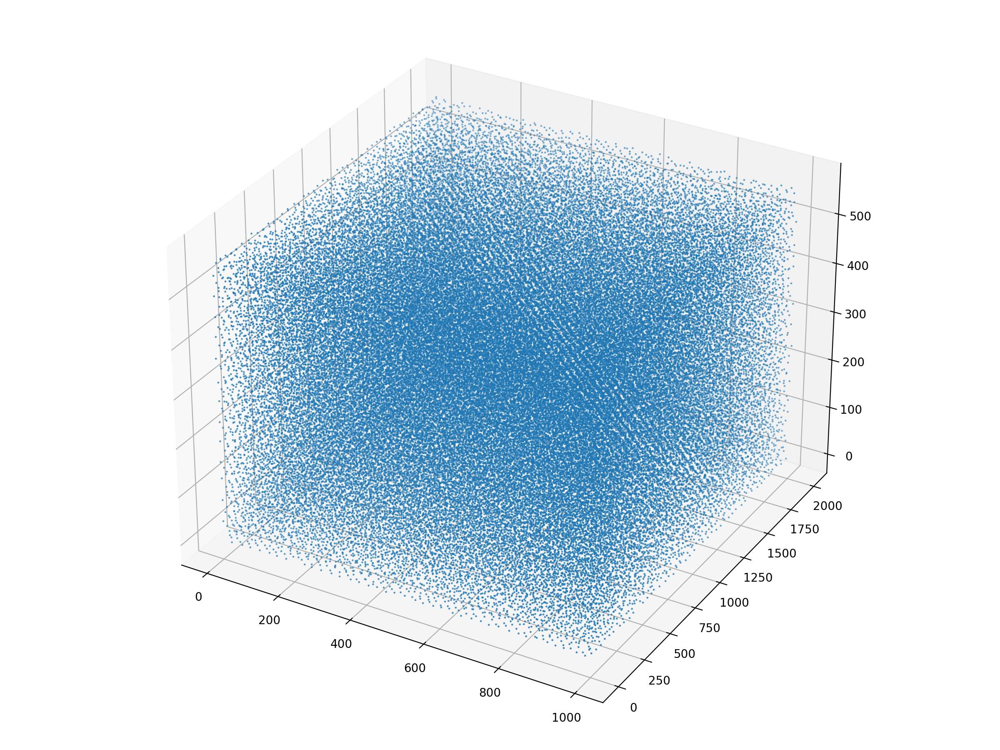

/tmp/ipykernel_118522/595483673.py:3: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


IndexError: too many indices for array: array is 1-dimensional, but 3 were indexed

In [329]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12,9))
ax = Axes3D(fig)

ax.scatter(x,y,z, marker='.', s=2)

ax.scatter(x[1,1,1], y[1,1,1], z[1,1,1], c='r')
ax.scatter(x[1,2,1], y[1,2,1], z[1,2,1], c='k')
ax.scatter(x[2,1,1], y[2,1,1], z[2,1,1], c='k')
ax.scatter(x[1,1,2], y[1,1,2], z[1,1,2], c='k')
ax.scatter(x[1,2,2], y[1,2,2], z[1,2,2], c='k')
ax.scatter(x[0,1,2], y[0,1,2], z[0,1,2], c='k')

ax.set_xlim((0,27))
ax.set_ylim((0,27))
ax.set_zlim((0,27))
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()

In [ ]:
# dmin = 
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12,9))
ax = Axes3D(fig)

ax.scatter(x,y,z, marker='.', s=2)

In [21]:
pos = np.column_stack((x, y, z))
dist = np.empty((pos.shape[0], pos.shape[0]))
#dist = np.full((pos_short.shape[0], pos_short.shape[0]), np.nan)

for i in range(pos.shape[0]):
    for j in range(pos.shape[0]):
        if i != j:
            dist[i,j] = np.linalg.norm(pos[i,:]-pos[j,:])
        else:
            dist[i,j] = np.nan
np.nanmin(dist)

1.999999999999999

In [37]:
# The bug
d = 1
dists = [0,np.nan, 5]
d = np.min(np.append(dists, float('inf')))    # d becomes nan
d <= dmin

False